Name: Chiban Oussama

# Predicting house prices

In [1]:
 
import pandas as pd
import numpy as mp
import matplotlib as plt
import seaborn as sns


In [2]:
import pandas as pd

labels = pd.read_csv('y_train_OXxrJt1.csv')
print(labels.info())
labels.head()




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id_annonce  37368 non-null  int64  
 1   price       37368 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 584.0 KB
None


,id_annonce,price
0,35996577,355000.0
1,35811033,190000.0
2,35731841,39000.0
3,35886765,299000.0
4,35781137,478000.0


In [3]:
import pandas as pd

features = pd.read_csv('X_train_J01Z4CN.csv')
print(features.info())
features.head()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id_annonce                   37368 non-null  int64  
 1   property_type                37368 non-null  object 
 2   approximate_latitude         37368 non-null  float64
 3   approximate_longitude        37368 non-null  float64
 4   city                         37368 non-null  object 
 5   postal_code                  37368 non-null  int64  
 6   size                         36856 non-null  float64
 7   floor                        9743 non-null   float64
 8   land_size                    15581 non-null  float64
 9   energy_performance_value     19068 non-null  float64
 10  energy_performance_category  19068 non-null  object 
 11  ghg_value                    18530 non-null  float64
 12  ghg_category                 18530 non-null  object 
 13  exposition      

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,nb_parking_places,nb_boxes,nb_photos,has_a_balcony,nb_terraces,has_a_cellar,has_a_garage,has_air_conditioning,last_floor,upper_floors
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,0.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,0.0,1.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,0.0,1.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
#effectuer une fusion (jointure) entre deux DataFrames, features et labels, sur la colonne commune 'id_annonce'

df = features.merge(labels, on='id_annonce')
print(df.info())
df.head()

#Nombre total d'entrées : Le DataFrame fusionné contient un total de 37 368 entrées (ou lignes).

#Structure des colonnes : Le DataFrame fusionné possède maintenant 28 colonnes au total.

#Types de données :

#Il y a 21 colonnes de type float64 (valeurs décimales).
#Il y a 2 colonnes de type int64 (valeurs entières).
#Il y a 5 colonnes de type object (généralement des chaînes de caractères).
#Données manquantes :

#Les colonnes ont des valeurs manquantes, comme indiqué dans les colonnes "Non-Null Count".
#Statistiques de mémoire : Le DataFrame fusionné occupe environ 8.3 MB de mémoire.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37368 entries, 0 to 37367
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id_annonce                   37368 non-null  int64  
 1   property_type                37368 non-null  object 
 2   approximate_latitude         37368 non-null  float64
 3   approximate_longitude        37368 non-null  float64
 4   city                         37368 non-null  object 
 5   postal_code                  37368 non-null  int64  
 6   size                         36856 non-null  float64
 7   floor                        9743 non-null   float64
 8   land_size                    15581 non-null  float64
 9   energy_performance_value     19068 non-null  float64
 10  energy_performance_category  19068 non-null  object 
 11  ghg_value                    18530 non-null  float64
 12  ghg_category                 18530 non-null  object 
 13  exposition      

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,nb_boxes,nb_photos,has_a_balcony,nb_terraces,has_a_cellar,has_a_garage,has_air_conditioning,last_floor,upper_floors,price
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,355000.0
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,190000.0
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39000.0
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,1.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,299000.0
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,1.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,478000.0


In [5]:
df.isna().sum()

#La commande df.isna().sum() est utilisée pour calculer le nombre de valeurs manquantes (NaN) dans chaque colonne du 
#DataFrame df. Plus précisément, elle renvoie une série (ou un DataFrame si vous le stockez dans une variable) contenant 
#le décompte des valeurs manquantes pour chaque colonne. Cela permet d'identifier rapidement quelles colonnes ont des données
#manquantes et dans quelle mesure.



id_annonce                         0
property_type                      0
approximate_latitude               0
approximate_longitude              0
city                               0
postal_code                        0
size                             512
floor                          27625
land_size                      21787
energy_performance_value       18300
energy_performance_category    18300
ghg_value                      18838
ghg_category                   18838
exposition                     28274
nb_rooms                        1566
nb_bedrooms                     2733
nb_bathrooms                   13273
nb_parking_places                  0
nb_boxes                           0
nb_photos                          0
has_a_balcony                      0
nb_terraces                        0
has_a_cellar                       0
has_a_garage                       0
has_air_conditioning               0
last_floor                         0
upper_floors                       0
p

In [6]:
df.duplicated().sum()


0

In [7]:


from sklearn.model_selection import train_test_split

seed = 123
train_set, test_set = train_test_split(
    df.drop('id_annonce', axis=1),
    test_size=0.2,
    random_state=seed
)

print("train shape:", train_set.shape, "test shape:", test_set.shape)

#L'ensemble d'entraînement (train_set) contient 29 894 lignes (observations) et 27 colonnes (caractéristiques).
#L'ensemble de test (test_set) contient 7 474 lignes (observations) et 27 colonnes (caractéristiques).
#Ces ensembles d'entraînement et de test sont utilisés pour construire et évaluer des modèles d'apprentissage automatique. 



train shape: (29894, 27) test shape: (7474, 27)


In [8]:
#L'analyse exploratoire des données (EDA) est une étape cruciale dans le processus de compréhension et de préparation des 
#données avant de construire des modèles d'apprentissage automatique ou de mener des analyses statistiques. 
#Visualisation des données :
#Traitement des valeurs manquantes 
#Analyse des caractéristiques :
#Analyse des valeurs aberrantes :
#Analyse des tendances et des motifs :
#Analyse de la cible :
#Évaluation de l'impact des caractéristiques :
#Résumé des statistiques :

In [9]:
real_estate = train_set.copy()
# crée une copie indépendante du DataFrame train_set et l'assigne à la variable real_estate. Cette copie permet de travailler
#sur les données sans modifier le DataFrame original,

In [10]:
real_estate['total_number_of_rooms'] = real_estate['nb_rooms'] + real_estate['nb_bedrooms'] + real_estate['nb_bathrooms']
real_estate['total_number_of_rooms']

10813    11.0
28163     8.0
2732     11.0
11636     NaN
34955     NaN
         ... 
7763      8.0
15377     NaN
17730    15.0
28030     NaN
15725     8.0
Name: total_number_of_rooms, Length: 29894, dtype: float64

In [11]:
real_estate['bedrooms_per_room']= real_estate['nb_bedrooms']/real_estate['total_number_of_rooms']
real_estate['bedrooms_per_room']

10813    0.454545
28163    0.375000
2732     0.272727
11636         NaN
34955         NaN
           ...   
7763     0.375000
15377         NaN
17730    0.400000
28030         NaN
15725    0.375000
Name: bedrooms_per_room, Length: 29894, dtype: float64

In [12]:
real_estate['total_parking_capacity']= real_estate['nb_parking_places'] + real_estate['nb_boxes']
real_estate['total_parking_capacity']

10813    1.0
28163    0.0
2732     0.0
11636    0.0
34955    0.0
        ... 
7763     0.0
15377    1.0
17730    0.0
28030    1.0
15725    1.0
Name: total_parking_capacity, Length: 29894, dtype: float64

In [13]:
!pip install geopy
# fournit des outils et des fonctionnalités liées à la géolocalisation et aux calculs de distances géographiques.

DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [14]:
from geopy.distance import geodesic
import pandas as pd
#calculer la distance géographique entre Paris et chaque point de données dans le DataFrame df

#définissent les coordonnées géographiques de Paris (latitude et longitude).
paris_latitude = 48.858370
paris_longitude = 2.294481

# FUNCTION TO CALCULATE DISTANCE BETWEEN PARIS AND A DATA POINT
def calculate_distance(row): #calculer la distance entre Paris et un point de données donné.
    point_latitude = row['approximate_latitude']
    point_longitude = row['approximate_longitude']
    point_coordinates = (point_latitude, point_longitude)
    paris_coordinates = (paris_latitude, paris_longitude)
    distance = geodesic(point_coordinates, paris_coordinates).km
    return distance

# Apply the function to your DataFrame
df['distance_to_paris'] = df.apply(calculate_distance, axis=1)# applique la fonction calculate_distance à chaque ligne 
#du DataFrame df et stocke les distances calculées dans une nouvelle colonne appelée 'distance_to_paris'.

# Access the 'distance_to_paris' column
distances = df['distance_to_paris']# Cette ligne extrait la colonne 'distance_to_paris' du DataFrame df et la stocke dans 
#la variable distances
print(distances)

#les distances géographiques calculées entre chaque point de données dans le DataFrame df et Paris. Chaque valeur 
#représente la distance en kilomètres entre le point de données correspondant et Paris.


0        688.340337
1        402.880188
2        278.419104
3        356.511936
4        398.715988
            ...    
37363    665.012343
37364      7.834845
37365    562.016093
37366     37.735687
37367    315.170487
Name: distance_to_paris, Length: 37368, dtype: float64


In [15]:
#extrait un échantillon aléatoire de cinq lignes du DataFrame df en sélectionnant uniquement les colonnes 'city' et
#'distance_to_paris'
selected_columns = df[['city', 'distance_to_paris']].sample(5)
#sélectionne un échantillon aléatoire de cinq lignes du DataFrame df en extrayant uniquement les colonnes 
#'city' et 'distance_to_paris'. Le résultat est stocké dans le DataFrame selected_columns.
print(selected_columns)



                    city  distance_to_paris
25470  neuilly-sur-seine           3.204634
10308        paris-18eme           5.459262
18965  neuilly-plaisance          16.500787
36195     marseille-7eme         663.454400
18310             cannes         694.383739


In [16]:
#générer un résumé statistique des données dans un DataFrame. Lorsque vous appelez real_estate.describe().T
real_estate.describe().T
#.T : Cette partie transpose le résumé statistique généré, de sorte que les caractéristiques (colonnes) deviennent des 
#lignes et les statistiques deviennent des colonnes



,count,mean,std,min,25%,50%,75%,max
approximate_latitude,29894.0,46.554705,2.354314,41.374436,43.930923,46.965949,48.842526,5.104601e+01
approximate_longitude,29894.0,2.607762,2.592422,-4.733545,1.089791,2.378397,4.567152,9.483665e+00
postal_code,29894.0,53712.291898,28786.435880,1000.000000,30210.000000,59000.000000,78230.000000,9.588000e+04
size,29477.0,1095.707060,5629.776972,1.000000,73.000000,115.000000,239.000000,4.113110e+05
floor,7813.0,3.457827,6.628996,1.000000,1.000000,2.000000,4.000000,5.500000e+01
land_size,12424.0,4005.178686,59071.859008,1.000000,363.000000,797.000000,1836.250000,6.203700e+06
energy_performance_value,15210.0,206.996121,872.853538,0.000000,125.000000,180.000000,240.000000,1.000000e+05
ghg_value,14791.0,32.323372,322.041271,0.000000,8.000000,16.000000,36.000000,1.702400e+04
nb_rooms,28634.0,4.234826,2.935642,0.000000,3.000000,4.000000,5.000000,1.250000e+02
nb_bedrooms,27707.0,2.854946,2.147069,0.000000,2.000000,3.000000,4.000000,1.180000e+02


In [17]:
#table de fréquence de mes varaiables qualitatives
for col in list(real_estate.select_dtypes(include='object')):
    print('----------Colon :', col, 'avec',real_estate[col].nunique(),'modalités----------')
    print(real_estate[col].value_counts(normalize=True))
    print('\n')
    
    # affiche les comptages normalisés des valeurs uniques dans la colonne actuelle (col). Cela signifie que pour chaque 
    #valeur unique, la fréquence (proportion) de cette valeur par rapport au nombre total d'observations est affichée. 
    #Cela peut être utile pour comprendre la distribution des différentes valeurs dans la colonne.

----------Colon : property_type avec 22 modalités----------
appartement          0.421757
maison               0.419315
divers               0.057403
terrain              0.041614
villa                0.020272
propriété            0.010470
terrain à bâtir      0.007794
duplex               0.005921
viager               0.004616
ferme                0.003512
parking              0.002710
loft                 0.001338
chalet               0.001338
château              0.000602
moulin               0.000368
manoir               0.000335
péniche              0.000201
hôtel particulier    0.000167
chambre              0.000134
gîte                 0.000067
atelier              0.000033
hôtel                0.000033
Name: property_type, dtype: float64


----------Colon : city avec 7702 modalités----------
toulouse           0.012544
montpellier        0.010035
paris-16eme        0.006590
paris-17eme        0.006322
paris-18eme        0.006055
                     ...   
bouge-chambalud    0.

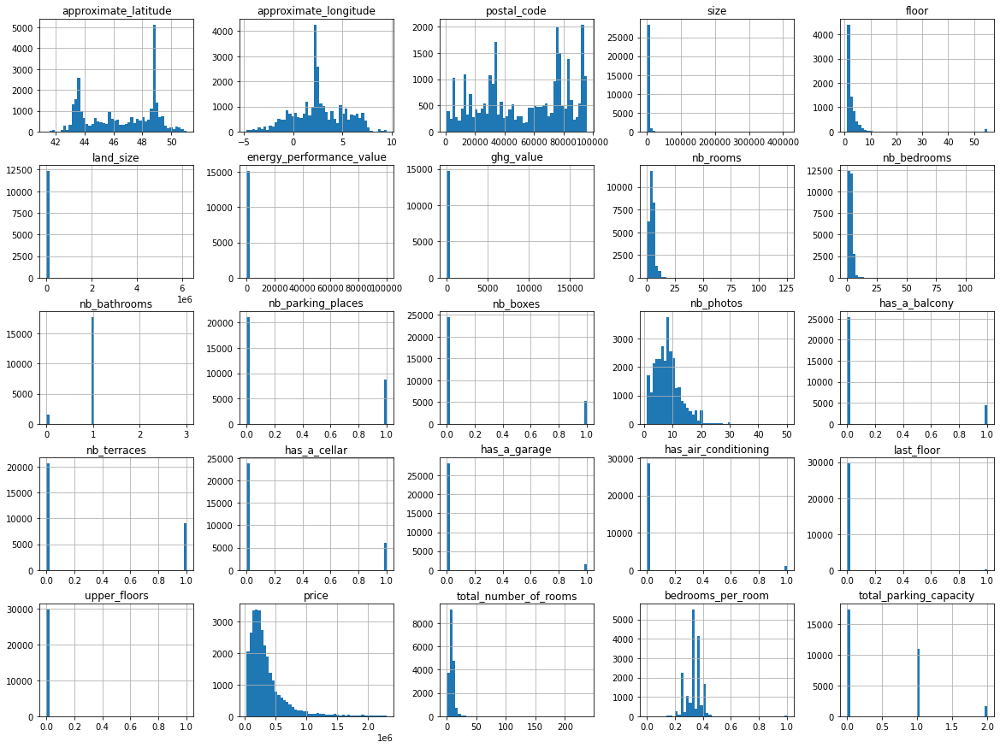

In [18]:
#Histogrammes
real_estate.hist(bins=50, figsize=(20, 15));
#bins=50: Cela spécifie le nombre de "bacs" ou "intervalles" dans lesquels les données sont regroupées pour créer 
#l'histogramme. Dans ce cas, il y a 50 intervalles.

#figsize=(20, 15): Cela définit la taille de la figure (l'image) qui affiche les histogrammes. 
# Les histogrammes montrent comment les valeurs sont réparties le long de l'axe horizontal (valeurs) par rapport à l'axe
#vertical (fréquence). Cela peut être utile pour obtenir un aperçu visuel de la distribution des données numériques dans 
                                                       #le DataFrame                                                  

In [19]:
import plotly.express as px
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude')
# créer un graphique de dispersion (scatter plot) 
#un graphique de dispersion où chaque point représente une paire de coordonnées (longitude, latitude) à partir des colonnes
#'approximate_longitude' et 'approximate_latitude'

In [20]:
!pip install plotly
# Plotly est une bibliothèque de visualisation de données qui vous permet de créer des graphiques interactifs 
#et des visualisations riches directement dans vos scripts Python

DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [21]:
fig = px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude', size='price', color='price')
fig.show()
# un graphique de dispersion interactif où chaque point représente une paire de coordonnées (longitude, latitude) à 
#partir des colonnes 'approximate_longitude' et 'approximate_latitude', et la taille et la couleur des points sont basées 
#sur les valeurs de la colonne 'price' du DataFrame real_estate

In [22]:
fig = px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude', size='price', color='property_type')
fig.show()
# un graphique de dispersion interactif où chaque point représente une paire de coordonnées (longitude, latitude) à
#partir des colonnes 'approximate_longitude' et 'approximate_latitude'. La taille des points est basée sur les valeurs de 
#la colonne 'price', et la couleur des points est basée sur les valeurs de la colonne 'property_type' du DataFrame real_estate

In [23]:
fig = px.scatter(real_estate[real_estate['property_type'].isin(['appartement', 'maison'])],
                 x='approximate_longitude', y='approximate_latitude', size='price', color='property_type')
fig.show()
#un graphique de dispersion interactif similaire aux précédents, mais uniquement pour les types de propriétés 
#"appartement" et "maison". Cela permet de visualiser la distribution géographique spécifique de ces deux types de
#propriétés en fonction de leur prix relatif.

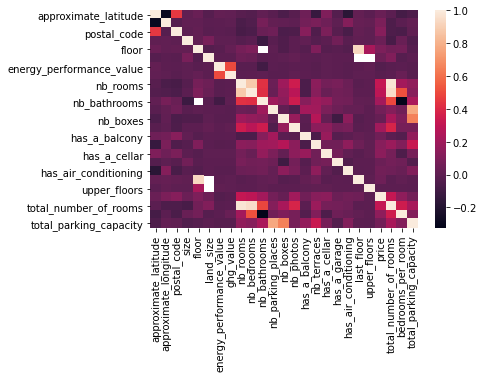

In [24]:
import seaborn as sns
sns.heatmap(real_estate.corr());
#vous obtiendrez une carte de chaleur où chaque case représente la corrélation entre deux colonnes numériques du
#DataFrame real_estate. Les couleurs et les nuances de couleurs indiquent le degré de corrélation (positive ou négative) 
#entre les paires de colonnes

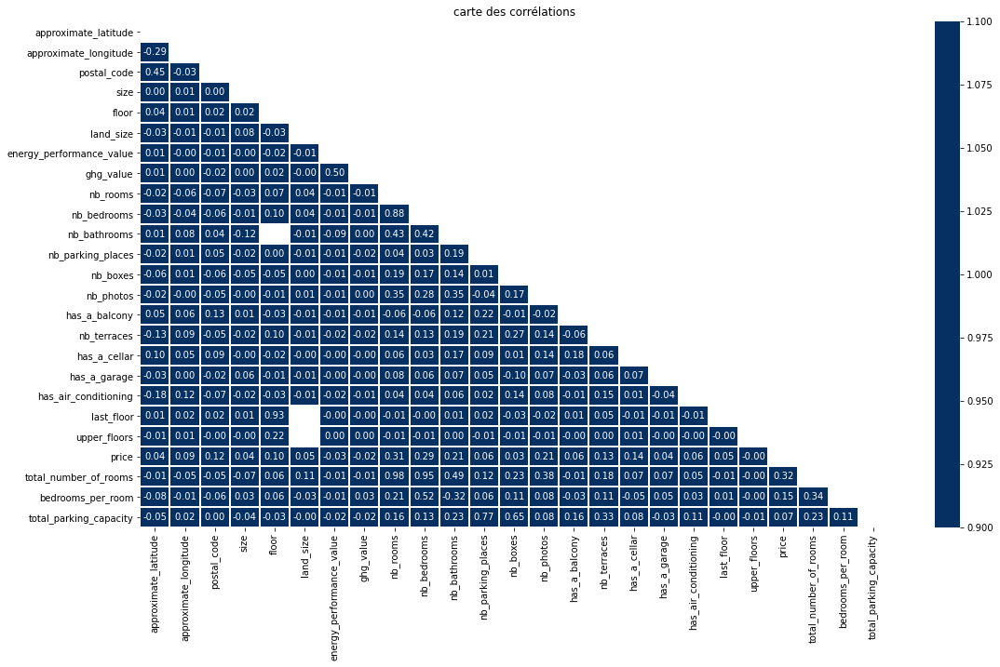

In [25]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(18,10))

real_estate_corr = real_estate.corr()
mask = np.triu(np.ones_like(real_estate_corr, dtype=bool))
sns.heatmap(
real_estate_corr, mask=mask, center=0,
    cmap= 'RdBu', linewidths = 1, annot= True,
    fmt= ".2f", vmin= 1, vmax=1)
plt.title("carte des corrélations")
plt.show()

#real_estate_corr: La matrice de corrélation à afficher.
#mask=mask: Le masque triangulaire supérieur.
#center=0: Le centre de la colormap.
#cmap='RdBu': Le colormap à utiliser (dans ce cas, la carte de couleurs Rouge-Bleu).
#linewidths=1: L'épaisseur des lignes de séparation entre les cases.
#annot=True: Afficher les valeurs numériques dans chaque case.
#fmt=".2f": Format des valeurs numériques (2 décimales flottantes).
#vmin=1, vmax=1: Les valeurs minimales et maximales pour la colormap.

In [26]:
# les corrélations entre les colonnes numériques du DataFrame real_estate. Les cases colorées représentent les valeurs de 
#corrélation, avec des couleurs allant du bleu au rouge selon le niveau de corrélation. Les nombres affichés dans chaque 
#case indiquent la corrélation entre les colonnes correspondantes.

----------price VS property_type ----------
property_type
parking              5.801333e+04
chambre              1.063750e+05
terrain à bâtir      1.083508e+05
terrain              1.218439e+05
viager               1.785017e+05
divers               3.059696e+05
ferme                3.214845e+05
maison               3.255814e+05
appartement          3.720782e+05
chalet               3.986384e+05
duplex               4.086984e+05
moulin               4.706545e+05
hôtel                4.910000e+05
loft                 5.049762e+05
villa                5.257610e+05
gîte                 5.550000e+05
propriété            6.504257e+05
péniche              6.925000e+05
hôtel particulier    7.083800e+05
manoir               7.822050e+05
château              1.078403e+06
atelier              1.300000e+06
Name: price, dtype: float64


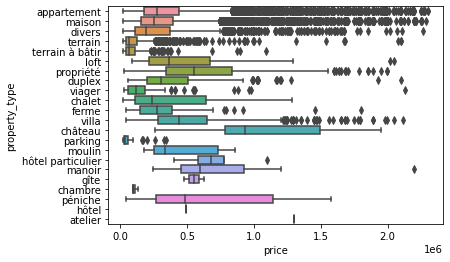

----------price VS energy_performance_category ----------
energy_performance_category
G    216562.129921
F    246950.354994
E    303041.066362
D    352285.848458
A    384611.190283
C    434601.926242
B    439656.787755
Name: price, dtype: float64


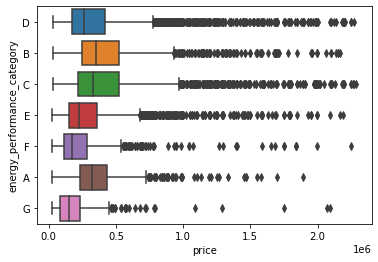

----------price VS ghg_category ----------
ghg_category
G    279869.831325
F    339485.526673
C    355154.803291
B    355794.675676
E    377837.122372
A    379216.728705
D    387317.205590
Name: price, dtype: float64


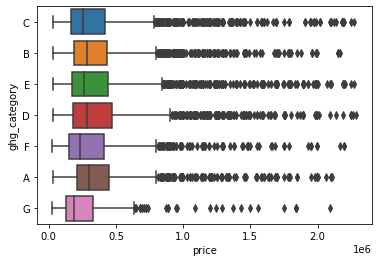

----------price VS exposition ----------
exposition
Nord          306179.398907
Nord-Ouest    321697.211111
Sud-Nord      358697.864286
Ouest         366705.218513
Est           367180.910394
Sud           392291.823234
Sud-Est       402456.744764
Est-Ouest     405793.345921
Nord-Est      435204.138889
Sud-Ouest     441905.737810
Nord-Sud      496062.142857
Ouest-Est     512836.821429
Name: price, dtype: float64


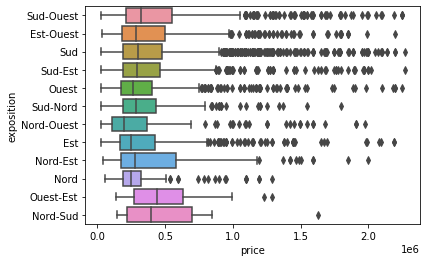

In [27]:
for col in list(real_estate.select_dtypes(include='object').drop('city', axis=1)):
    print("----------price VS", col, "----------")
    print(real_estate.groupby(col)['price'].mean().sort_values())
    sns.boxplot(data=real_estate, x='price', y=col)
    plt.show()
    plt.close()
    # une série de diagrammes en boîte qui montrent comment les prix varient en fonction de chaque catégorie des colonnes 
    #de type "object". Cela peut vous aider à identifier des tendances de prix différentes pour différentes catégories et
    #à comprendre comment les différentes variables catégorielles influencent les prix dans votre ensemble de données.
    #C'est une approche utile pour obtenir un aperçu initial des relations entre les variables catégorielles et les prix.

In [28]:
#Médiane (ligne au centre de la boîte) : La médiane indique la valeur centrale de la distribution des prix pour chaque 
#catégorie de la variable catégorielle. C'est le point autour duquel environ la moitié des données sont regroupées.

#Boîte (IQR) : La taille de la boîte représente la dispersion des prix pour chaque catégorie. Une boîte plus grande indique 
#une plus grande variabilité des prix.

#Moustaches : Les moustaches donnent une idée de l'étendue des données, c'est-à-dire la gamme des prix pour chaque catégorie. 
#Si les moustaches sont longues, cela peut indiquer une dispersion plus large des données.

#Points isolés : Les points situés en dehors des moustaches sont des valeurs aberrantes potentielles, c'est-à-dire des données 
#qui sont éloignées de la distribution principale. Cela pourrait indiquer des observations exceptionnelles ou des erreurs de
#saisie.

In [29]:
# Elle vise à préparer, nettoyer et transformer les données brutes en un format approprié pour l'analyse ou l'entraînement
#de modèles. 
#Collecte des données :     Nettoyage des données   transformation des données    Encodage des variables catégorielles  
#Gestion des valeurs manquantes    Séparation des ensembles de données   Réduction de dimension   Normalisation/Standardisation 
#Validation croisée :  Documentation 

In [30]:
trainset = train_set.copy()
#vous obtiendrez une nouvelle variable trainset qui contient les mêmes données que train_set, mais qui peut être 
#utilisée de manière indépendante pour des opérations ultérieures

In [31]:
X_train = trainset.drop("price", axis=1)
Y_train = trainset['price']
#vous avez séparé vos données en deux ensembles distincts : X_train, qui contient les caractéristiques 
#(variables indépendantes), et Y_train, qui contient les valeurs cibles (variable dépendante). Cela vous permettra de
#les utiliser pour entraîner et évaluer un modèle d'apprentissage automatique.

In [32]:
!pip install --upgrade scikit-learn


DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [33]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

vars_num= list(trainset.drop('price', axis=1).select_dtypes(exclude='object'))

def add_features(X):
    Z = X.copy()
    Z['living_area_per_total_land'] = Z['size'] / Z['land_size']
    Z['total_number_of_rooms'] = Z['nb_rooms']+ Z['nb_bedrooms']+ Z['nb_bathrooms']
    Z['bedrooms_per_room'] = Z['nb_bedrooms'] / Z['total_number_of_rooms']
    Z['total_parking_capacity'] = Z['nb_parking_places'] + Z['nb_boxes']
    Z['num_amenities'] = Z['has_a_balcony'] + Z['has_a_cellar'] + Z['has_a_garage'] + Z['has_air_conditioning']
    Z['distance_to_paris'] = Z.apply(calculate_distance, axis=1)
    return Z.values

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

num_pipeline = Pipeline([
    ('feat_adder', FunctionTransformer(add_features)),
    ('num_impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])
num_pipeline

Pipeline(steps=[('feat_adder',
                 FunctionTransformer(func=<function add_features at 0x00000139D5C15A60>)),
                ('num_impute', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler())])

In [34]:
#C'est parfait, vous avez créé un pipeline avec les trois étapes que vous avez décrites. Voici un récapitulatif de chaque
#étape dans votre pipeline de prétraitement des données numériques :

#FunctionTransformer : Cette étape utilise la fonction add_features pour ajouter de nouvelles caractéristiques à vos données, 
#basées sur des calculs spécifiques que vous avez définis dans cette fonction.

#SimpleImputer : Cette étape remplace les valeurs manquantes dans vos caractéristiques numériques par la médiane de chaque 
#colonne. La stratégie que vous avez choisie est "median".

#StandardScaler : Cette étape met à l'échelle vos caractéristiques numériques en centrant les données autour de zéro avec
#une échelle unitaire.

#Maintenant que vous avez mis en place ce pipeline, vous pouvez l'appliquer à vos données d'entraînement et de test pour 
#garantir une préparation cohérente des données avant de les utiliser

In [35]:
#crée un pipeline de prétraitement des données numériques dans un contexte d'apprentissage automatique. Un pipeline 
#est une séquence d'étapes de traitement des données qui sont exécutées les unes après les autres. Le pipeline est 
#conçu pour automatiser et simplifier le processus de préparation des données, ce qui est une étape essentielle pour 
#entraîner et évaluer des modèles d'apprentissage automatique.

#Ajout de nouvelles caractéristiques (features) : La première étape, nommée 'feat_adder', utilise la fonction add_features 
#pour créer de nouvelles caractéristiques (features) à partir des caractéristiques existantes dans vos données. Ces nouvelles 
#caractéristiques sont calculées à l'aide de formules spécifiques et peuvent aider votre modèle à capturer des relations 
#complexes entre les variables.

#Imputation des valeurs manquantes : La deuxième étape, 'num_impute', utilise le SimpleImputer pour remplacer les valeurs
#manquantes dans les caractéristiques numériques par la médiane de chaque colonne. Cela garantit que toutes les valeurs 
#manquantes sont gérées de manière cohérente et que votre modèle ne rencontre pas de problèmes liés aux données manquantes.

#Mise à l'échelle (scaling) : La troisième étape, 'scaler', utilise StandardScaler pour mettre à l'échelle les caractéristiques
#numériques en centrant les données autour de zéro avec une échelle unitaire. Cela garantit que les caractéristiques sont à
#une échelle comparable, ce qui peut améliorer la convergence et les performances des algorithmes d'apprentissage automatique.

In [36]:
#En utilisant ce pipeline, vous pouvez prétraiter les caractéristiques catégorielles en gérant les valeurs manquantes
#et en les convertissant en variables binaires qui peuvent être utilisées par les modèles d'apprentissage automatique.

vars_cat = list(trainset.select_dtypes(include='object').drop('city', axis=1))
cat_pipeline = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='constant', fill_value="UNKNOWN")),
    ('encoder', OneHotEncoder(sparse=False, handle_unknown='ignore'))
])
cat_pipeline

Pipeline(steps=[('cat_imputer',
                 SimpleImputer(fill_value='UNKNOWN', strategy='constant')),
                ('encoder',
                 OneHotEncoder(handle_unknown='ignore', sparse=False))])

In [37]:
#SimpleImputer : Cette étape utilise le SimpleImputer pour gérer les valeurs manquantes dans les caractéristiques catégorielles.
#La stratégie que vous avez choisie est "constant", ce qui signifie que les valeurs manquantes seront remplies avec une valeur
#constante. Dans ce cas, la valeur constante est "UNKNOWN". Cela permet de traiter de manière cohérente les valeurs manquantes 
#en les remplaçant par une catégorie spécifique.

#OneHotEncoder : Cette étape utilise le OneHotEncoder pour encoder les caractéristiques catégorielles en variables binaires 
#(0 ou 1) pour chaque catégorie. L'option handle_unknown='ignore' indique au encodeur d'ignorer les catégories inconnues qui 
#pourraient apparaître lors de la transformation. L'option sparse=False signifie que la sortie sera une matrice dense plutôt 
#qu'une matrice creuse. Cela transforme chaque catégorie en une série de colonnes binaires, ce qui est utile pour les 
#algorithmes d'apprentissage automatique.

In [38]:
from sklearn.compose import ColumnTransformer

preprocessor = ColumnTransformer([
    ("num", num_pipeline, vars_num),
    ("cat", cat_pipeline, vars_cat)
])
preprocessor

# appliquer toutes les transformations nécessaires aux différentes colonnes de vos données d'une manière organisée et 
#automatisée. Vous pouvez utiliser le preprocessor pour transformer vos ensembles de données d'entraînement et de test avant 
#de les utiliser pour l'entraînement de modèles d'apprentissage automatique.

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('feat_adder',
                                                  FunctionTransformer(func=<function add_features at 0x00000139D5C15A60>)),
                                                 ('num_impute',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 ['approximate_latitude',
                                  'approximate_longitude', 'postal_code',
                                  'size', 'floor', 'land_size',
                                  'energy_performance_value', 'ghg_value',
                                  'nb_r...
                                  'has_a_balcony', 'nb_terraces',
                                  'has_a_cellar', 'has_a_garage',
                                  'has_air_conditioning', 'last_floor',
                                  'upper_floors']),
                                ('cat',
                                 Pipeline(steps=[('cat_imputer',
                                                  SimpleImputer(fill_value='UNKNOWN',
                                                                strategy='constant')),
                                                 ('encoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['property_type',
                                  'energy_performance_category', 'ghg_category',
                                  'exposition'])])

In [39]:
#application aux données d'entrainement

X_train_prepared = preprocessor.fit_transform(X_train)
print(X_train_prepared.shape)
X_train_prepared

#vous avez utilisé le preprocessor pour prétraiter vos données d'entraînement X_train en appliquant les transformations
#numériques et catégorielles spécifiées. Le résultat est stocké dans la matrice X_train_prepared, qui peut être utilisée 
#pour entraîner vos modèles d'apprentissage automatique.


(29894, 78)


C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



array([[ 0.98030347, -0.06715911,  1.36829606, ...,  0.        ,
         0.        ,  1.        ],
       [-0.39282477, -1.40638835, -1.26840651, ...,  0.        ,
         0.        ,  1.        ],
       [-0.24320179, -0.84242234, -1.2979348 , ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-0.2605051 , -0.70053739, -1.29550306, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.90957735, -1.71950283, -0.6410172 , ...,  0.        ,
         0.        ,  1.        ],
       [-0.09496148,  1.48887805,  0.71172586, ...,  0.        ,
         0.        ,  1.        ]])

In [40]:
#Le résultat que vous avez obtenu est une matrice numpy avec une forme (shape) de (29894, 78). Cette matrice représente 
#vos données d'entraînement prétraitées et prêtes à être utilisées pour l'entraînement de modèles d'apprentissage automatique.

#Chaque valeur dans la matrice représente une caractéristique prétraitée pour un exemple particulier. Par exemple, la première 
#valeur 0.98030347 dans la première ligne et la première colonne représente la valeur prétraitée de la première caractéristique
#numérique pour le premier exemple. De même, la deuxième valeur -0.06715911 dans la première ligne et la deuxième colonne 
#représente la valeur prétraitée de la deuxième caractéristique numérique pour le premier exemple. 

In [41]:
# évaluer et comparer différentes approches de modélisation afin de choisir celle qui fonctionne le mieux pour résoudre votre 
#problème spécifique. Cette étape vise à explorer plusieurs modèles avec différentes configurations, paramètres et techniques 
#pour déterminer celui qui offre les meilleures performances.

In [42]:
#Régression linéaire
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X_train_prepared, Y_train)
#Vous avez importé le modèle de régression linéaire depuis la bibliothèque Scikit-Learn, puis vous avez instancié et ajusté 
#(fit) le modèle à vos données d'entraînement prétraitées.
#lin_reg = LinearRegression() : Cette ligne crée une instance du modèle de régression linéaire en utilisant le constructeur
#LinearRegression(). Vous pouvez maintenant utiliser lin_reg pour entraîner et évaluer votre modèle.

#lin_reg.fit(X_train_prepared, Y_train) : Cette ligne ajuste (fit) le modèle de régression linéaire aux données d'entraînement 
#prétraitées. X_train_prepared sont les caractéristiques prétraitées, et Y_train est la variable cible que vous essayez de 
#prédire à l'aide du modèle.

#Après avoir ajusté le modèle, lin_reg contient les coefficients et les paramètres nécessaires pour effectuer des prédictions 
#basées sur les caractéristiques prétraitées.

LinearRegression()

In [43]:
#Le RMSE est une mesure de la dispersion des erreurs entre les valeurs prédites et les valeurs réelles. 
#Il est souvent utilisé pour comparer différents modèles de régression et pour évaluer la précision d'un modèle.
#Plus le RMSE est proche de zéro, plus les prédictions du modèle sont précises par rapport aux valeurs réelles.

#Vous avez effectué des prédictions à l'aide de votre modèle de régression linéaire sur les données d'entraînement,
#puis calculé la racine carrée de l'erreur quadratique moyenne (RMSE) pour évaluer les performances de votre modèle.

#Prédiction
Y_train_preds = lin_reg.predict(X_train_prepared)
#RMSE
from sklearn.metrics import mean_squared_error
lin_rmse= mean_squared_error(Y_train, Y_train_preds, squared=False)
lin_rmse
#la racine carrée de l'erreur quadratique moyenne (RMSE) est d'environ 268880.38. Cela signifie que, en moyenne, 
#les prédictions de votre modèle de régression linéaire ont une erreur d'environ 268880.38 unités par rapport aux valeurs
#réelles de la variable cible 

268880.3795429567

In [44]:
#validation croisée
#évaluer les performances de votre modèle de régression linéaire sur différentes partitions de vos données d'entraînement. 
#Cette approche vous donne une idée plus robuste de la performance du modèle en utilisant plusieurs jeux de validation croisée.

from sklearn.model_selection import cross_val_score
scores = cross_val_score(lin_reg, X_train_prepared, Y_train, scoring="neg_mean_squared_error", cv=3)
lin_rmse_scores = mp.sqrt(-scores)
lin_rmse_scores
#les racines carrées des erreurs quadratiques moyennes négatives (RMSE) pour chaque pli de validation. Cependant, la troisième 
#valeur semble être extrêmement élevée (1.21822731e+15), ce qui peut indiquer un problème potentiel avec votre modèle ou vos
#données.

#Une erreur aussi importante peut être due à des valeurs aberrantes (outliers) dans vos données, à une mauvaise préparation 
#des caractéristiques ou à d'autres problèmes. 

array([2.97332646e+05, 2.72188211e+05, 1.21822731e+15])

In [45]:
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())
    # un tableau de scores (par exemple, les scores de RMSE obtenus lors de la validation croisée) et affiche des informations
    #utiles sur ces scores
    # Cela vous aide à comprendre la stabilité et la cohérence des performances de votre modèle sur différentes partitions 
    #de données.

In [46]:
display_scores(lin_rmse_scores)
#Scores individuels de la validation croisée : [297,332.646, 272,188.211, 1,218,227,310,000.0]
#Moyenne des scores : 406,075,771,466,954.44
#"Écart type des scores : 574,277,862,956,972.4
#Ces résultats indiquent que votre modèle de régression linéaire a produit des scores très élevés (en termes d'erreur 
#quadratique moyenne négative) lors de la validation croisée. La moyenne des scores est extrêmement élevée, ce qui suggère
#que quelque chose ne va pas avec la manière dont le modèle est ajusté ou évalué.

#Étant donné que le score le plus élevé (1,218,227,310,000.0) est bien au-delà des deux autres, cela peut être un indicateur 
#que quelque chose d'inattendu s'est produit lors de la validation croisée. Cela peut être dû à des problèmes tels que des 
#valeurs aberrantes, des erreurs dans la préparation des données, des erreurs dans la définition des caractéristiques ou des 
#problèmes de validation croisée.

Scores: [2.97332646e+05 2.72188211e+05 1.21822731e+15]
Mean: 406075771466954.44
Standard deviation: 574277862956972.4


In [47]:
# def train_and_evaluate(ml_algo):
#     reg = ml_algo
#     reg.fit(X_train_prepared, Y_train)
    
#     Y_train_prediction = reg.predict(X_train_prepared)
#     reg_rmse = mean_squared_error(Y_train, Y_train_predictions, squared= False)
#     print("RMSE:", reg_rmse)
    
#     reg_scores = cross_val_score(reg, X_train_prepared, Y_train, scoring="neg_mean_squared_error", cv=3)
#     reg_rmse_scores = np.sqrt(-reg_scores)
#     display_scores(reg_rmse_scores)
#     return reg

In [48]:
def train_and_evaluate(ml_algo):
    reg = ml_algo
    reg.fit(X_train_prepared, Y_train)
    
    Y_train_predictions = reg.predict(X_train_prepared)
    reg_rmse = mean_squared_error(Y_train, Y_train_predictions, squared= False)
    print("RMSE:", reg_rmse)
    
    reg_scores = cross_val_score(reg, X_train_prepared, Y_train, scoring="neg_mean_squared_error", cv=3)
    reg_rmse_scores = np.sqrt(-reg_scores)
    display_scores(reg_rmse_scores)
    return reg
#une fonction train_and_evaluate qui prend en entrée un algorithme d'apprentissage automatique, l'entraîne sur vos données 
#d'entraînement et évalue ses performances à l'aide de diverses métriques. Cela vous permet d'automatiser le processus
#d'entraînement et d'évaluation, et vous aide à comparer rapidement les performances de différents modèles. 



In [49]:
all_models = []
from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.neural_network import MLPRegressor
for ml_algo in [RandomForestRegressor(random_state=seed), XGBRegressor(random_state=seed), MLPRegressor(random_state=seed, max_iter=500)]:
    print(ml_algo)
    model = train_and_evaluate(ml_algo)
    all_models.append(model)
    print('\n')


# Vous avez inclus les modèles RandomForestRegressor, XGBRegressor et MLPRegressor dans la boucle cette boucle itère à 
#travers différents modèles, les entraîne et évalue à l'aide de la fonction train_and_evaluate, puis stocke les modèles 
#entraînés dans la liste all_models. Assurez-vous simplement de corriger toute redondance dans le calcul du RMSE.

RandomForestRegressor(random_state=123)
RMSE: 56576.165126792635
Scores: [158963.13799805 156982.80654059 158122.20483009]
Mean: 158022.71645624415
Standard deviation: 811.5218718533283


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)
RMSE: 103806.35591454197
Scores: [155624.38305845 153642.90330617 157014

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



RMSE: 268649.44750104885


C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



Scores: [270776.96551888 277102.35229516 275300.88233237]
Mean: 274393.40004880313
Standard deviation: 2660.861081003629




C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



In [50]:
#Réglage des hyperparamètres

num_pipeline = Pipeline([
    ('feat_adder', FunctionTransformer(add_features)),
    ('num_impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='constant', fill_value="UNKNOWN")),
    ('encoder', OneHotEncoder(sparse=False, handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ("num", num_pipeline, vars_num),
    ("cat", cat_pipeline, vars_cat)
])

full_Pipeline = Pipeline([
    ("preprocess", preprocessor),
    ('model', XGBRegressor(random_state=seed))
    
])
full_Pipeline

#ce pipeline prend en charge le prétraitement des caractéristiques catégorielles en gérant les valeurs manquantes en
#utilisant la valeur constante "UNKNOWN", puis en les encodant en variables binaires avec l'encodeur OneHotEncoder. 
#Cela permet de préparer vos caractéristiques catégorielles de manière à ce qu'elles puissent être utilisées efficacement 
#dans vos modèles d'apprentissage automatique.

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('feat_adder',
                                                                   FunctionTransformer(func=<function add_features at 0x00000139D5C15A60>)),
                                                                  ('num_impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['approximate_latitude',
                                                   'approximate_longitude',
                                                   'postal_code', 'size',
                                                   'floor', 'land_size',
                                                   'energy_perfor...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=123, ...))])

In [51]:
full_Pipeline[1]

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)

In [52]:
X_train = train_set.drop('price', axis= 1)
Y_train= train_set['price']
#Cette séparation est couramment effectuée pour préparer les données d'entraînement avant de les utiliser pour ajuster 
#(entraîner) un modèle d'apprentissage automatique. Vous pouvez ensuite utiliser X_train pour les caractéristiques et 
#Y_train pour la variable cible lors de l'entraînement de votre modèle.

In [53]:
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV  # Corrected import
from scipy.stats import randint
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb  # Make sure you import XGBoost

param_dist = {
    'model__n_estimator': randint(low=50, high=200),
    'model__max_depth': randint(low=1, high=20),
    'model__learning_rate': np.arange(0.05, 1, 0.05),
    'model__colsample_bytree': np.arange( 0.05, 1, 0.05)
}
from sklearn.model_selection import RandomzedSearchCV
rnd_search = RandomizedSearchCV(
    full_Pipeline, param_distributions=param_dist,
    n_iter=15, cv=3, scoring='neg_mean_squared_error',
    random_state=seed, n_jobs=1
)
rnd_search.fit(X_train, Y_train)
print("Meilleurs hyperparamètres:", rnd_search.best_params_)
print("Meilleur score:", np.sqrt(-rnd_search.best_score_))

ImportError: cannot import name 'RandomzedSearchCV' from 'sklearn.model_selection' (C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\model_selection\__init__.py)

In [55]:
from scipy.stats import randint
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

param_dist = {
    'model__n_estimator': randint(low=50, high=200),
    'model__max_depth': randint(low=1, high=20),
    'model__learning_rate': np.arange(0.05, 1, 0.05),
    'model__colsample_bytree': np.arange(0.05, 1, 0.05)
}

rnd_search = RandomizedSearchCV(
    full_Pipeline, param_distributions=param_dist,
    n_iter=15, cv=3, scoring='neg_mean_squared_error',
    random_state=seed, n_jobs=1
)
rnd_search.fit(X_train, Y_train)

print("Meilleurs hyperparamètres


SyntaxError: EOL while scanning string literal (<ipython-input-55-9cf3ed579bdd>, line 20)

In [56]:
from scipy.stats import randint
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

param_dist = {
    'model__n_estimator': randint(low=50, high=200),
    'model__max_depth': randint(low=1, high=20),
    'model__learning_rate': np.arange(0.05, 1, 0.05),
    'model__colsample_bytree': np.arange(0.05, 1, 0.05)
}

rnd_search = RandomizedSearchCV(
    full_Pipeline, param_distributions=param_dist,
    n_iter=15, cv=3, scoring='neg_mean_squared_error',
    random_state=seed, n_jobs=1
)
rnd_search.fit(X_train, Y_train)

print("Meilleurs hyperparamètres:", rnd_search.best_params_)
print("Meilleur score:", np.sqrt(-rnd_search.best_score_))


C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:51:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:51:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:52:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:52:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:52:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:52:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:52:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:53:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:53:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:53:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:53:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:53:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:54:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:54:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:54:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:54:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:55:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:55:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:55:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:56:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:57:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:57:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:58:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:58:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:58:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:58:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:59:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:59:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:59:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[01:59:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:00:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:00:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:00:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:00:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:01:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:01:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:02:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:02:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:02:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.



C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



[02:03:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "n_estimator" } are not used.

Meilleurs hyperparamètres: {'model__colsample_bytree': 0.4, 'model__learning_rate': 0.15000000000000002, 'model__max_depth': 16, 'model__n_estimator': 185}
Meilleur score: 153779.6187725298


In [ ]:
pd.DataFrame(rnd_search.cv_results_)

In [57]:
final_model = rnd_search.best_estimator_
final_model

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('feat_adder',
                                                                   FunctionTransformer(func=<function add_features at 0x00000139D5C15A60>)),
                                                                  ('num_impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['approximate_latitude',
                                                   'approximate_longitude',
                                                   'postal_code', 'size',
                                                   'floor', 'land_size',
                                                   'energy_perfor...
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None,
                              learning_rate=0.15000000000000002, max_bin=None,
                              max_cat_threshold=None, max_cat_to_onehot=None,
                              max_delta_step=None, max_depth=16,
                              max_leaves=None, min_child_weight=None,
                              missing=nan, monotone_constraints=None,
                              n_estimator=185, n_estimators=100, n_jobs=None,
                              num_parallel_tree=None, predictor=None, ...))])

In [58]:
#données de test
X_test = test_set.drop("price", axis=1)
Y_test = test_set['price']


In [59]:
#prédictions sur les données de test
final_preds = final_model.predict(X_test)
final_rmse = mean_squared_error(Y_test, final_preds, squared=False)

In [60]:
#importance des attributs
feature_importances = final_model[1].feature_importances_
feature_importances

array([4.5921081e-03, 1.6722575e-02, 9.3511222e-03, 2.4639124e-02,
       6.2256604e-03, 9.3732793e-03, 3.9259046e-03, 6.2401057e-03,
       1.1935784e-01, 3.3997178e-02, 3.8739320e-02, 2.6742320e-03,
       2.3718388e-03, 5.7900306e-03, 5.8045671e-03, 1.1735628e-02,
       4.8463261e-03, 6.0102418e-03, 1.4697581e-02, 1.2172950e-02,
       6.3582463e-03, 7.9641994e-03, 4.2125039e-02, 2.1845685e-02,
       9.9882167e-03, 5.7654013e-03, 7.0009105e-02, 5.9791513e-02,
       3.9367466e-03, 3.1468044e-03, 1.8834248e-02, 1.4938766e-02,
       4.1409563e-02, 9.5153153e-03, 4.5849928e-03, 4.2810355e-04,
       6.2991603e-05, 2.6637129e-03, 1.6289832e-02, 1.8222062e-02,
       2.1851121e-02, 7.4530873e-03, 2.7434895e-02, 1.8265814e-02,
       5.6188316e-03, 8.8429525e-03, 1.8697707e-03, 3.7205540e-02,
       1.4499038e-02, 2.8797085e-03, 8.8144811e-03, 1.4267618e-02,
       7.4223811e-03, 5.2808099e-03, 5.4443046e-03, 5.5414978e-03,
       7.6252944e-03, 5.9773154e-03, 5.2988464e-03, 7.6230159e

In [61]:
extra_attribs= [
    'living_area_per_total_land',
    'total_number_of_rooms',
    'bedrooms_per_room',
    'total_parking_capacity',
    'num_ameneties',
    'distance_to_paris'
]

In [62]:
cat_ohe_attribs = list(final_model[0].named_transformers_['cat'].get_feature_names_out())
cat_ohe_attribs

['property_type_appartement',
 'property_type_atelier',
 'property_type_chalet',
 'property_type_chambre',
 'property_type_château',
 'property_type_divers',
 'property_type_duplex',
 'property_type_ferme',
 'property_type_gîte',
 'property_type_hôtel',
 'property_type_hôtel particulier',
 'property_type_loft',
 'property_type_maison',
 'property_type_manoir',
 'property_type_moulin',
 'property_type_parking',
 'property_type_propriété',
 'property_type_péniche',
 'property_type_terrain',
 'property_type_terrain à bâtir',
 'property_type_viager',
 'property_type_villa',
 'energy_performance_category_A',
 'energy_performance_category_B',
 'energy_performance_category_C',
 'energy_performance_category_D',
 'energy_performance_category_E',
 'energy_performance_category_F',
 'energy_performance_category_G',
 'energy_performance_category_UNKNOWN',
 'ghg_category_A',
 'ghg_category_B',
 'ghg_category_C',
 'ghg_category_D',
 'ghg_category_E',
 'ghg_category_F',
 'ghg_category_G',
 'ghg_catego

In [63]:
len(cat_ohe_attribs)

51

In [64]:
len(vars_num)

21

In [65]:
attributes = vars_num + extra_attribs + cat_ohe_attribs
print(len(attributes))
attributes

78


['approximate_latitude',
 'approximate_longitude',
 'postal_code',
 'size',
 'floor',
 'land_size',
 'energy_performance_value',
 'ghg_value',
 'nb_rooms',
 'nb_bedrooms',
 'nb_bathrooms',
 'nb_parking_places',
 'nb_boxes',
 'nb_photos',
 'has_a_balcony',
 'nb_terraces',
 'has_a_cellar',
 'has_a_garage',
 'has_air_conditioning',
 'last_floor',
 'upper_floors',
 'living_area_per_total_land',
 'total_number_of_rooms',
 'bedrooms_per_room',
 'total_parking_capacity',
 'num_ameneties',
 'distance_to_paris',
 'property_type_appartement',
 'property_type_atelier',
 'property_type_chalet',
 'property_type_chambre',
 'property_type_château',
 'property_type_divers',
 'property_type_duplex',
 'property_type_ferme',
 'property_type_gîte',
 'property_type_hôtel',
 'property_type_hôtel particulier',
 'property_type_loft',
 'property_type_maison',
 'property_type_manoir',
 'property_type_moulin',
 'property_type_parking',
 'property_type_propriété',
 'property_type_péniche',
 'property_type_terrain

In [66]:
importance_result = sorted(zip(feature_importances, attributes), reverse=True)
importance_result

[(0.11935784, 'nb_rooms'),
 (0.070009105, 'distance_to_paris'),
 (0.059791513, 'property_type_appartement'),
 (0.04212504, 'total_number_of_rooms'),
 (0.041409563, 'property_type_divers'),
 (0.03873932, 'nb_bathrooms'),
 (0.03720554, 'property_type_viager'),
 (0.033997178, 'nb_bedrooms'),
 (0.027434895, 'property_type_parking'),
 (0.024639124, 'size'),
 (0.02185112, 'property_type_manoir'),
 (0.021845685, 'bedrooms_per_room'),
 (0.018834248, 'property_type_chambre'),
 (0.018265814, 'property_type_propriété'),
 (0.018222062, 'property_type_maison'),
 (0.016722575, 'approximate_longitude'),
 (0.016289832, 'property_type_loft'),
 (0.014938766, 'property_type_château'),
 (0.014697581, 'has_air_conditioning'),
 (0.014499038, 'property_type_villa'),
 (0.014267618, 'energy_performance_category_C'),
 (0.01217295, 'last_floor'),
 (0.011735628, 'nb_terraces'),
 (0.010713753, 'exposition_Nord-Sud'),
 (0.009988217, 'total_parking_capacity'),
 (0.009515315, 'property_type_duplex'),
 (0.009373279, '

In [67]:
imp_df = pd.DataFrame(importance_result, columns=["Score d'importance", "Variables"])
imp_df

,Score d'importance,Variables
0,0.119358,nb_rooms
1,0.070009,distance_to_paris
2,0.059792,property_type_appartement
3,0.042125,total_number_of_rooms
4,0.041410,property_type_divers
...,...,...
73,0.002372,nb_boxes
74,0.002169,ghg_category_G
75,0.001870,property_type_terrain à bâtir
76,0.000428,property_type_gîte


<AxesSubplot:xlabel="Score d'importance", ylabel='Variables'>

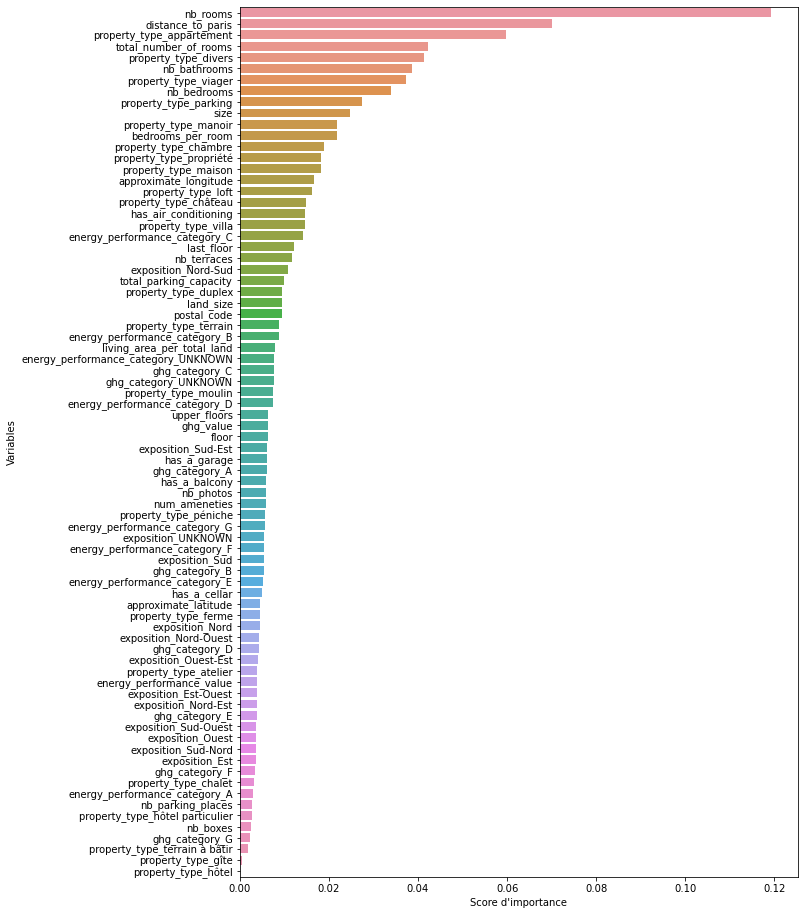

In [68]:
plt.figure(figsize=(10, 16))
sns.barplot(data=imp_df, x="Score d'importance", y="Variables")

In [69]:
--allow-chromium-download

NameError: name 'allow' is not defined